#### Step -1: Plotting Corners on Chess Board

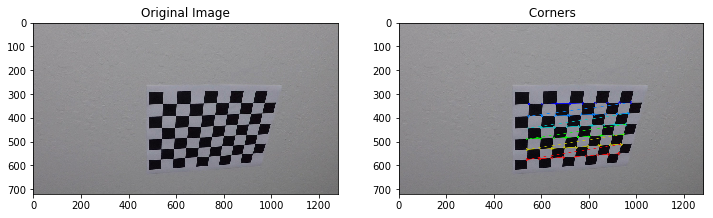

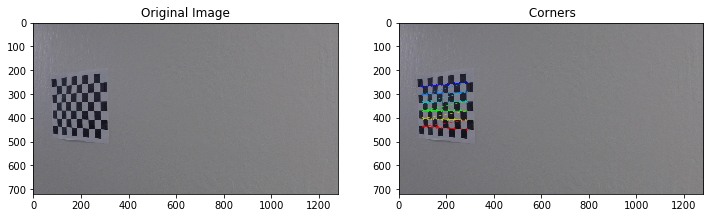

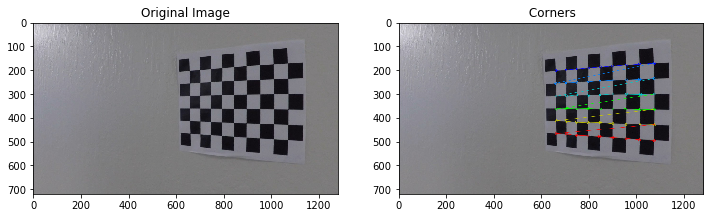

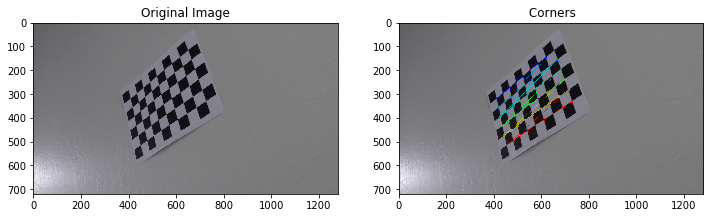

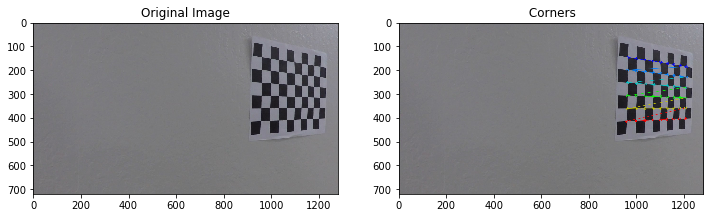

...

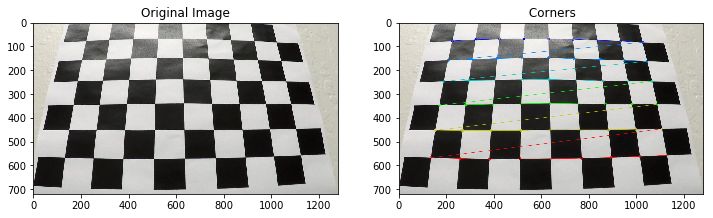

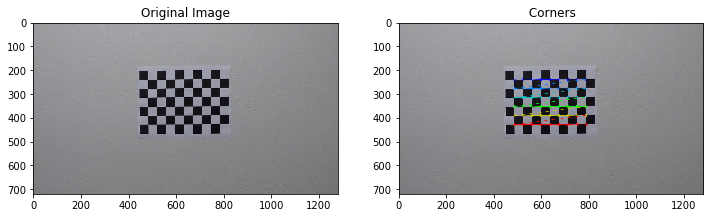

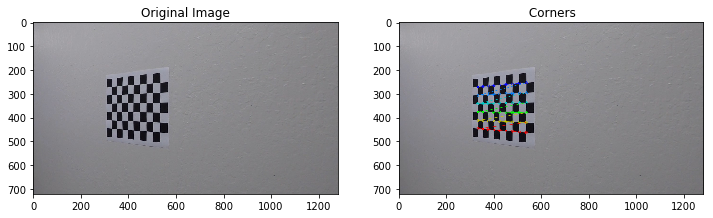

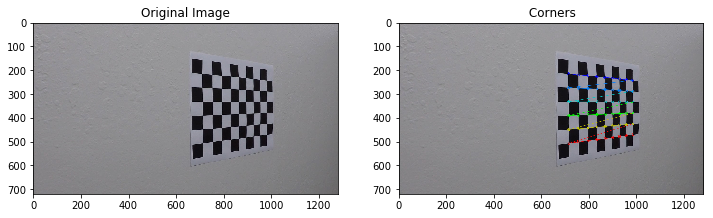

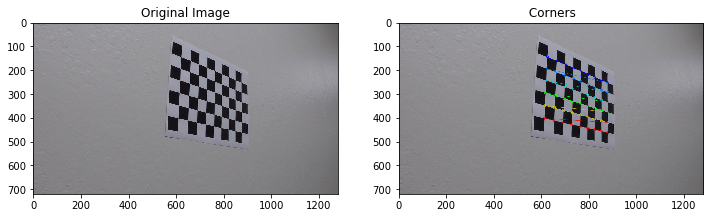

In [1]:
import glob
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np


#Defining Object points
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)
objpoints = []
imgpoints = []


images = glob.glob('camera_cal/calibration*.jpg')

for i, image in enumerate(images):
    img = mpimg.imread(image)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
        ax1.imshow(mpimg.imread(image))
        ax1.set_title('Original Image', fontsize=12)
        ax2.imshow(img)
        ax2.set_title(' Corners', fontsize=12)
        plt.show()

#### Step-2: Correcting Distortion

In [3]:
def U_image(img, objpoints, imgpoints):   
    
    img_size = (img.shape[1], img.shape[0])
    
    # Doing camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    return dst

In [4]:
def W_image(img, src, dst, image_size):
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, image_size, flags=cv2.INTER_LINEAR)
    Minv = cv2.getPerspectiveTransform(dst, src)

    return warped, M, Minv

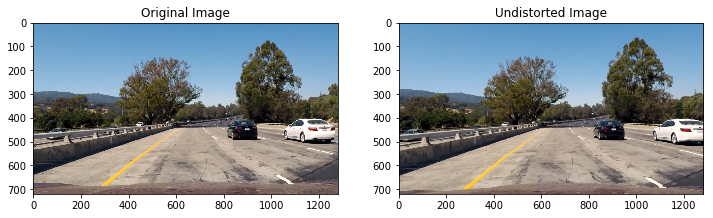

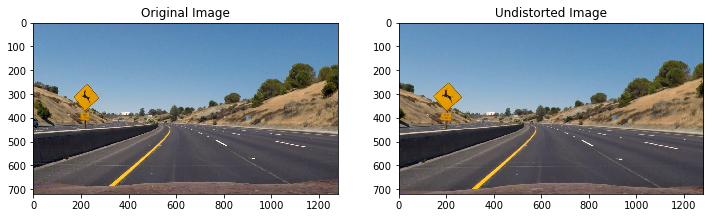

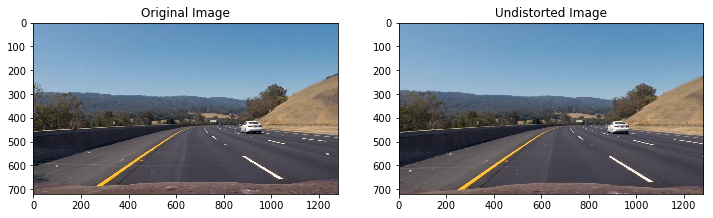

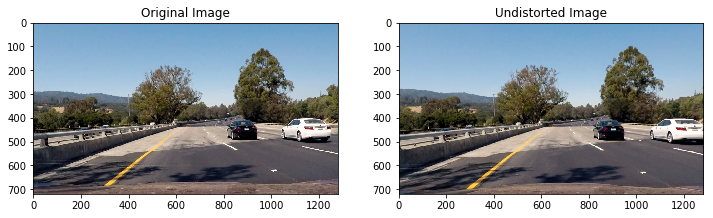

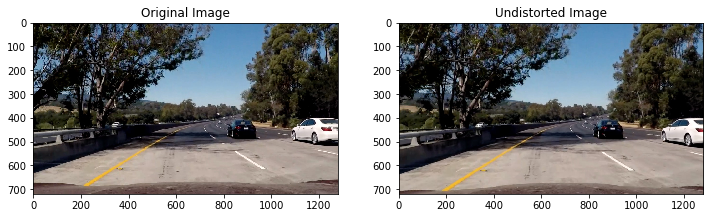

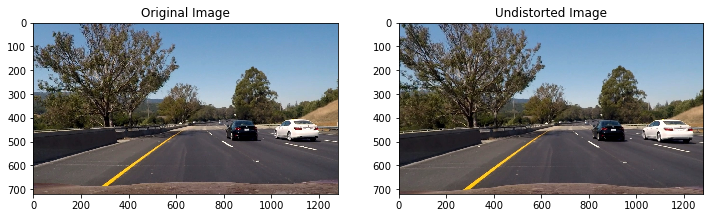

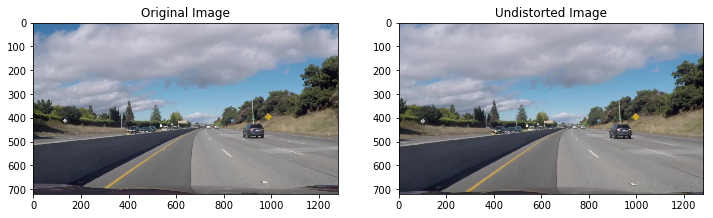

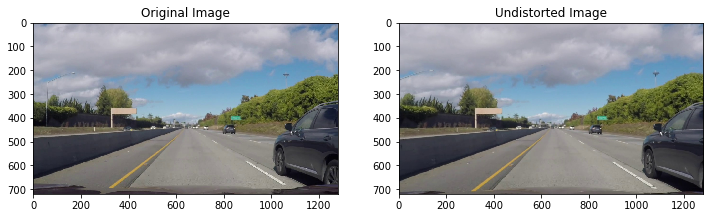

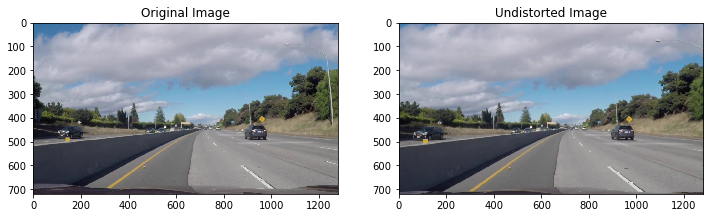

In [5]:
for image in glob.glob('test_images/test*.jpg'):
    img = mpimg.imread(image)
    undist=U_image(img,objpoints,imgpoints)  
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=12)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=12)
    plt.show()

#### Applying Persprective Transformation

In [6]:
# SRC Calculations
def srcNdst_cal(image):
    center_point = np.uint(image.shape[1]/2)
    y_top = np.uint(image.shape[0]/1.5)
    
    x_top_left = center_point - .25*np.uint(image.shape[1]/2) + 50
    x_top_right = center_point + .25*np.uint(image.shape[1]/2) - 50
    x_bottom_left = center_point - 1*np.uint(image.shape[1]/2) + 150
    y_bottom_left = np.uint(image.shape[0])
    x_bottom_right = np.uint(image.shape[1]) - 150
    
    # trapezoid following road lines
    #src = np.float32([[x_bottom_left, y_bottom_left],
    #                  [x_bottom_right, y_bottom_left],
    #                  [x_top_right, y_top],
    #                  [x_top_left, y_top]])
    #print("source points:\n", src)
    
    corners = np.float32([[253, 697], [585, 456], [700, 456], [1061, 690]])
    new_top_left = np.array([corners[0, 0], 0])
    new_top_right = np.array([corners[3, 0], 0])
    offset = [50, 0]
    
    img_size = (image.shape[1], image.shape[0])
    
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    dst = np.float32([corners[0] + offset, new_top_left + offset, new_top_right - offset, corners[3] - offset])
    
    # rectangle around entire image
    #dst = np.float32([[x_bottom_left, image.shape[0]],
    #                  [x_bottom_right, image.shape[0]],
    #                  [x_bottom_right, 0],
    #                  [x_bottom_left, 0]])
    #print("destination points:\n", dst)
    
    return src, dst

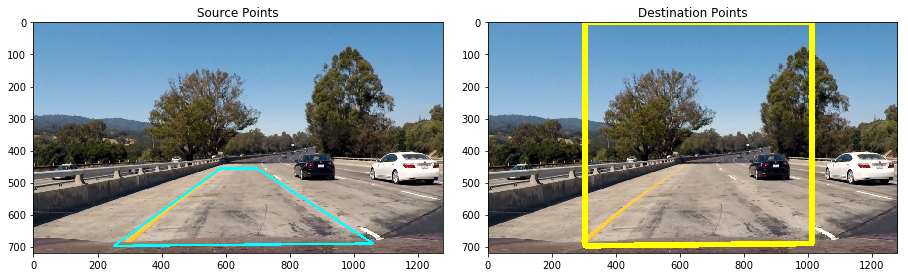

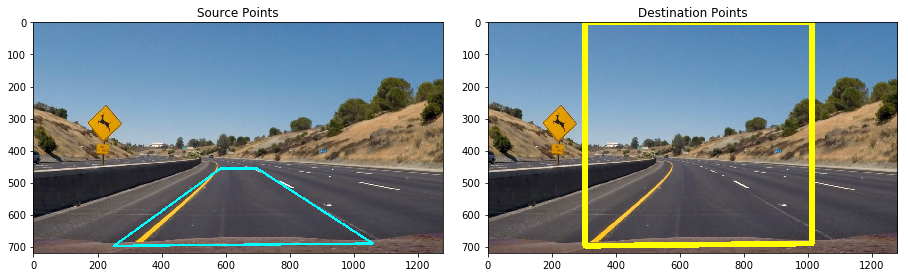

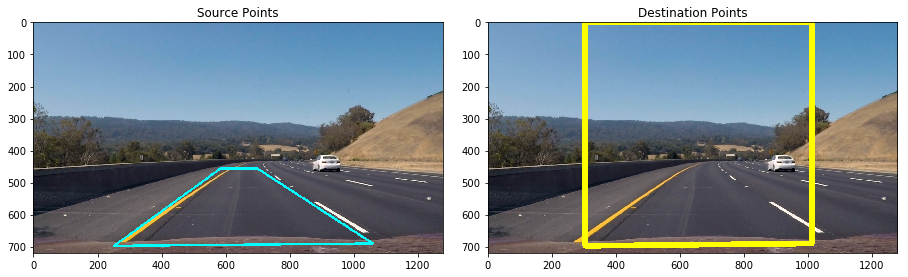

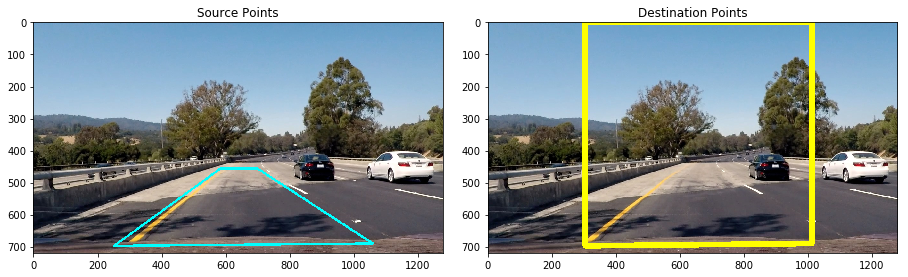

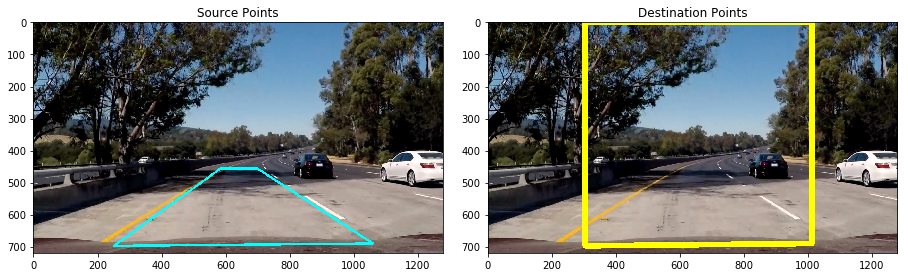

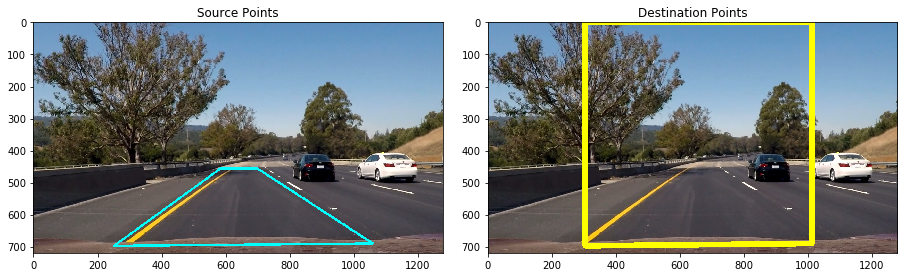

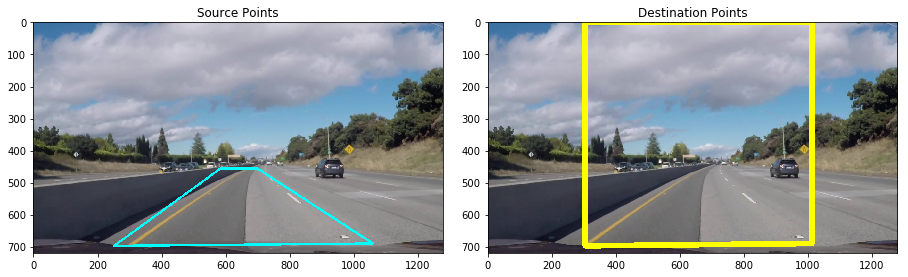

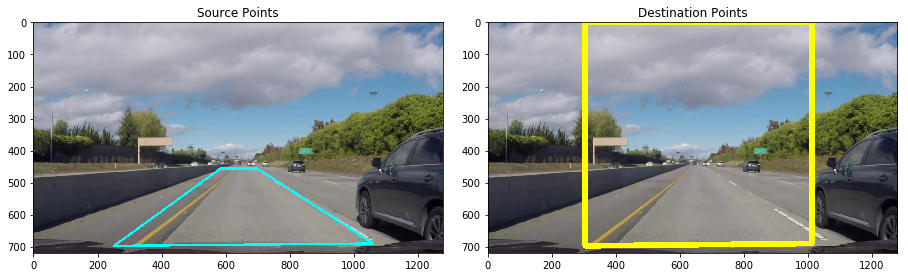

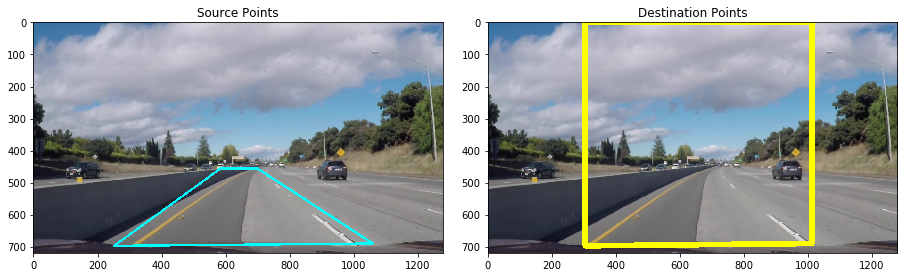

In [7]:
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=mpimg.imread(image)
    src,dst=srcNdst_cal(img)
    #Plotting the points on the orignal image
    points_image_src = img
    points_image_dst = points_image_src.copy()
    
    src_pts = src.reshape((-1, 1, 2)).astype("int32")
    cv2.polylines(points_image_src, [src_pts], True, (0, 255, 255), thickness=5)
    
    dst_pts = dst.reshape((-1, 1, 2)).astype("int32")
    cv2.polylines(points_image_dst, [dst_pts], True, (255, 255, 0), thickness=15)

    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    f.tight_layout()
    ax1.imshow(points_image_src)
    ax1.set_title('Source Points', fontsize=12)
    ax2.imshow(points_image_dst)
    ax2.set_title('Destination Points', fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

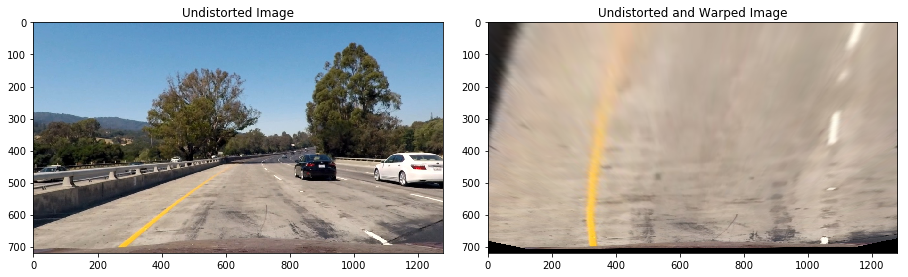

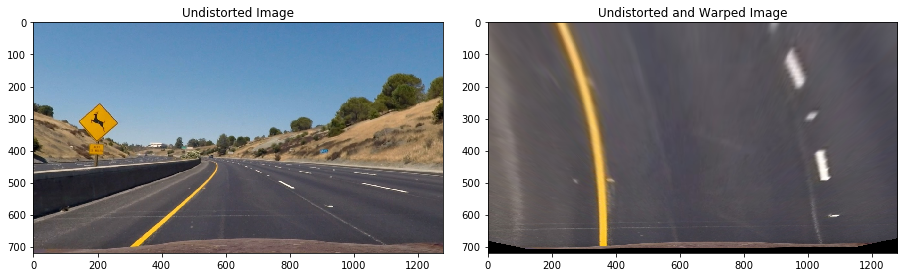

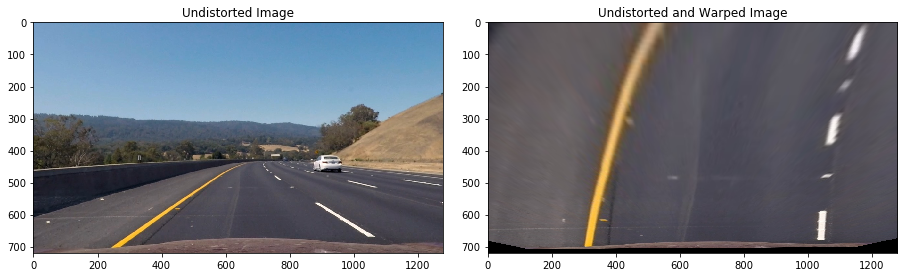

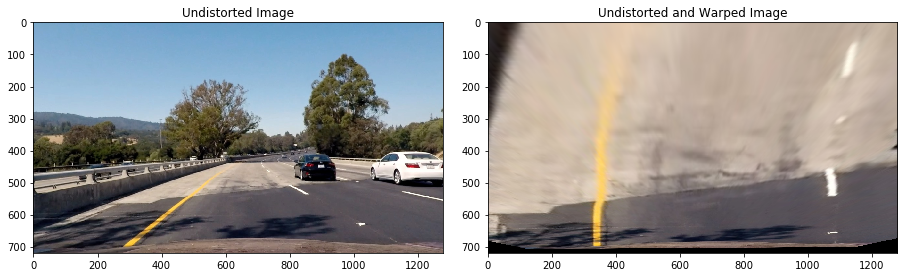

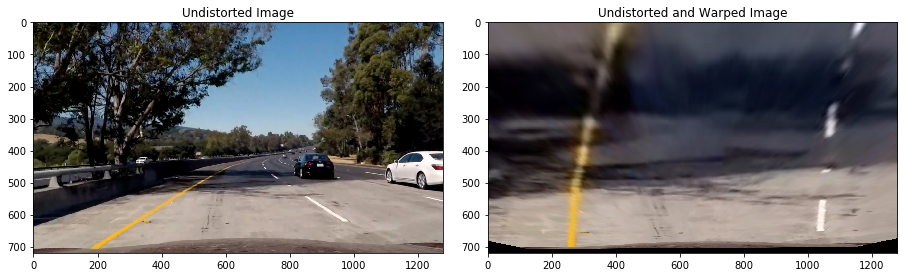

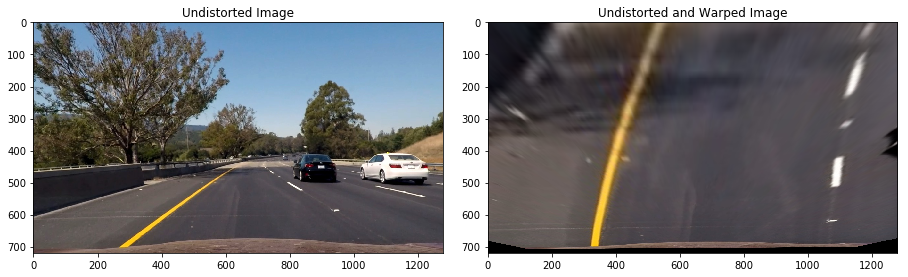

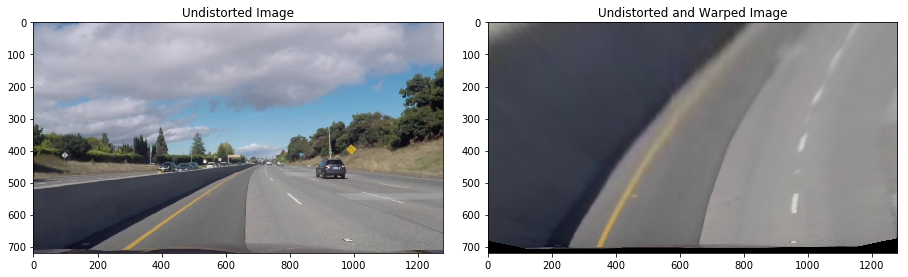

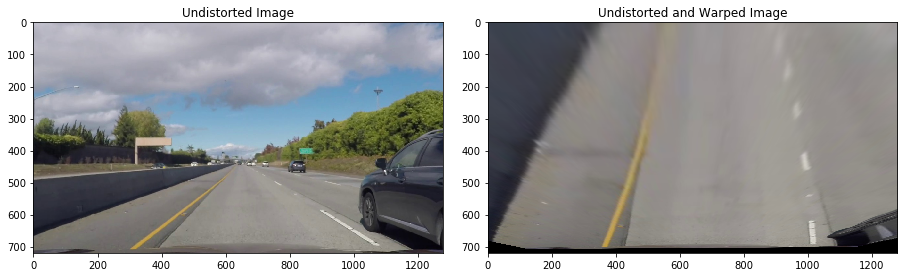

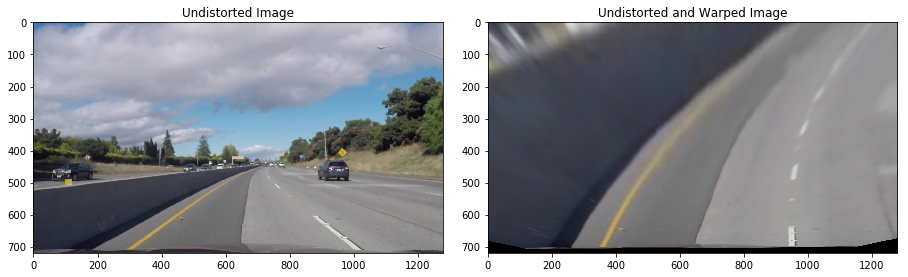

In [8]:
#Warraping images
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=mpimg.imread(image)
    undist=U_image(img,objpoints,imgpoints)
    src,dst=srcNdst_cal(img)
    warped, M, Minv=W_image(undist, src, dst, img_size)
    
    
    # Displaying the Images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    f.tight_layout()
    ax1.imshow(undist)
    ax1.set_title('Undistorted Image', fontsize=12)
    ax2.imshow(warped)
    ax2.set_title('Undistorted and Warped Image', fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

#### Applying Binary & Gradient Threshold

In [23]:
def thresholded_binary(undist):
    
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS).astype("float")
    s_channel = hls[:,:,2]
    
    # Sobel x
    gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    return color_binary, combined_binary,sxbinary,s_binary

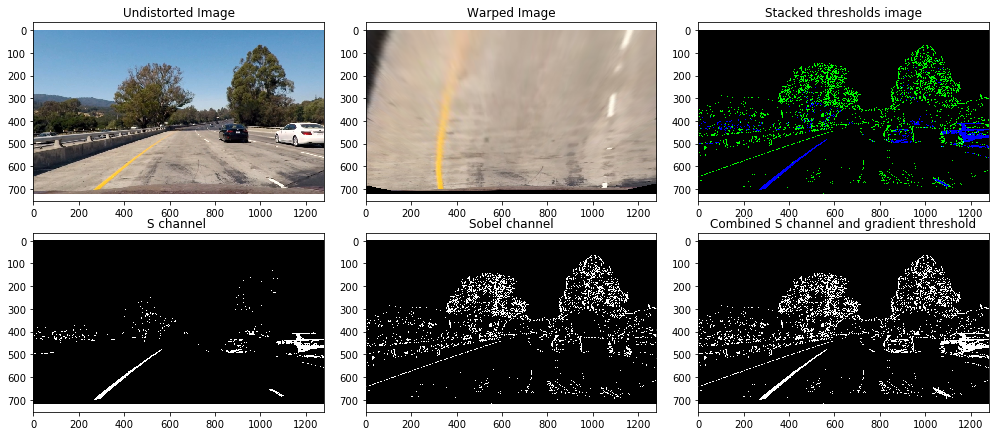

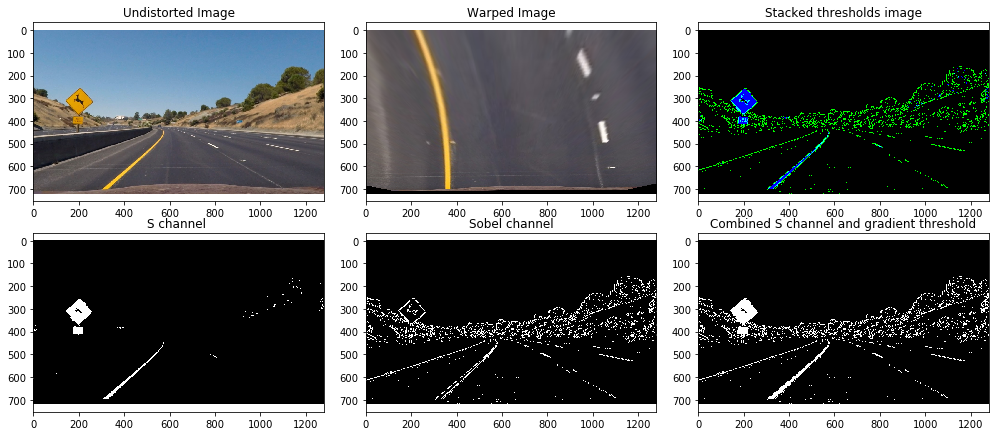

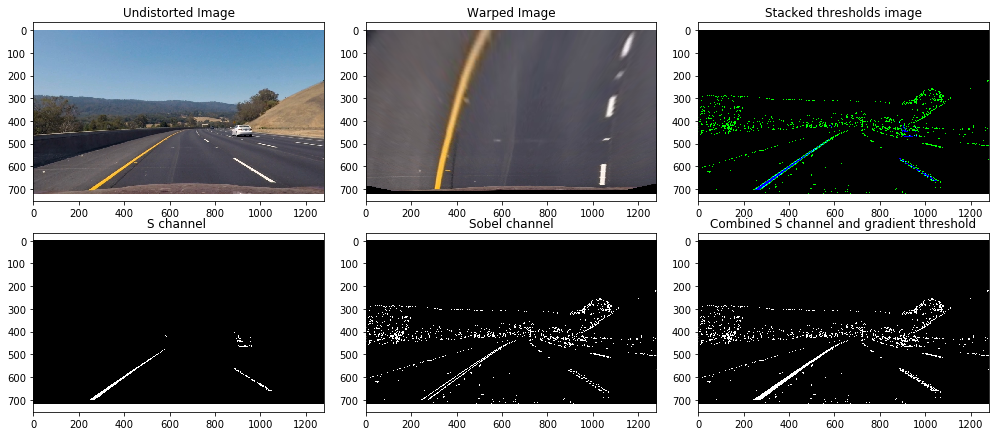

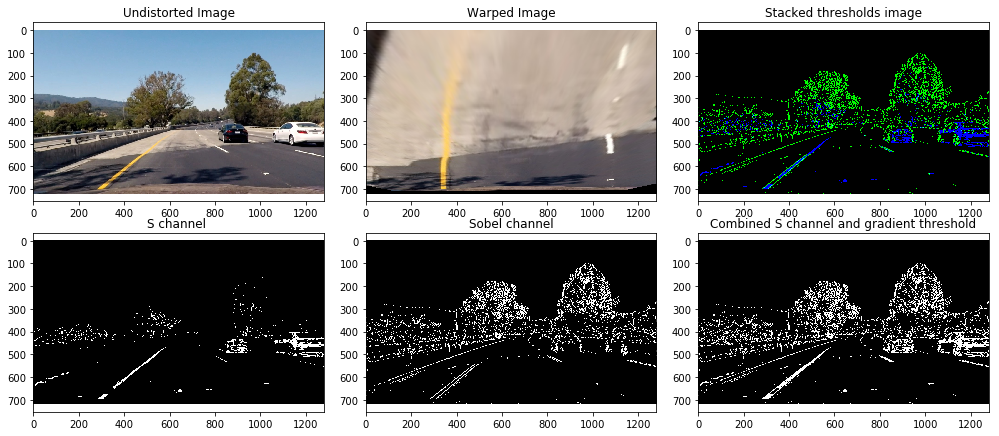

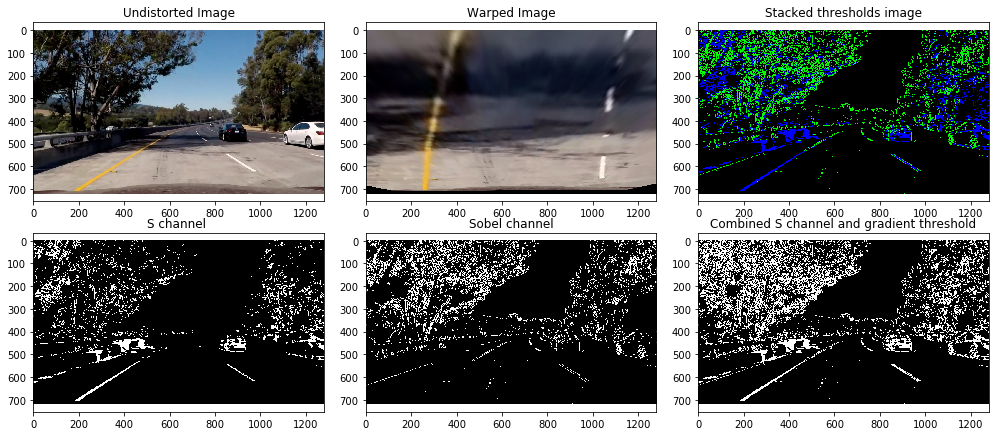

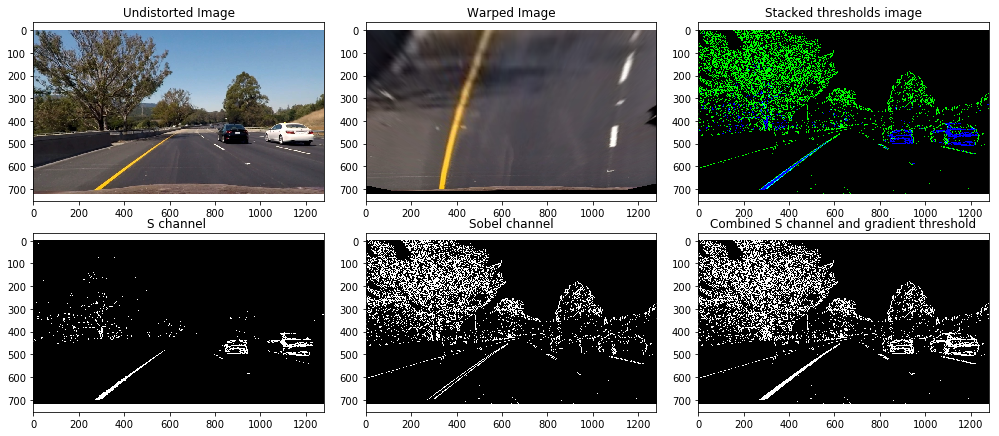

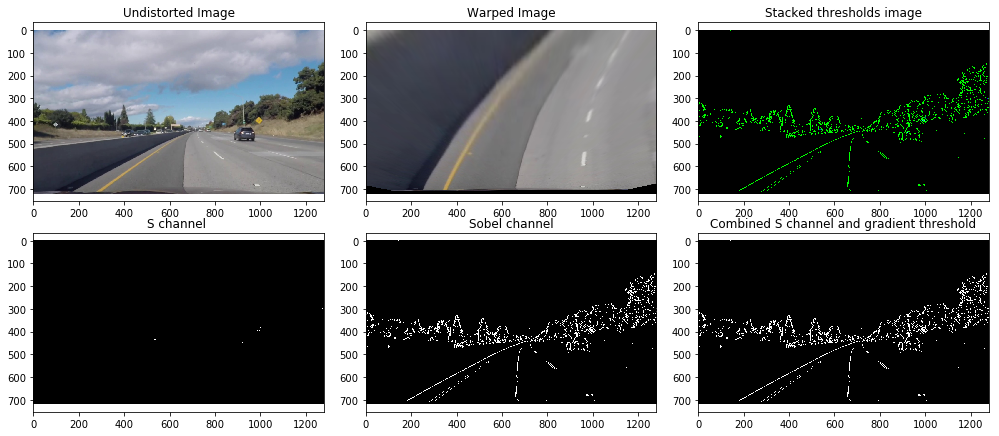

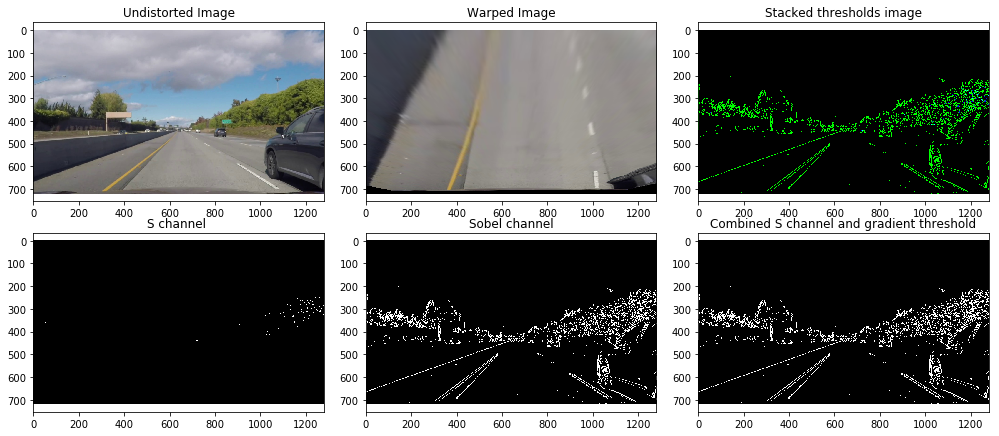

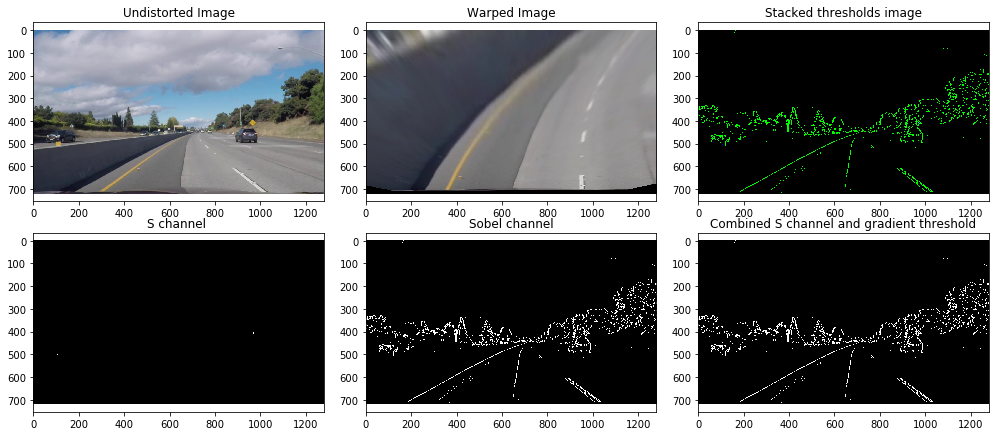

In [10]:
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=mpimg.imread(image)
    undist=U_image(img,objpoints,imgpoints)
    src,dst=srcNdst_cal(img)
    warped, M, Minv=W_image(undist, src, dst, img_size)
    color_binary, combined_binary,sxbinary,s_binary=thresholded_binary(undist)
    
    f, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(2,3, sharey='col', sharex='row', figsize=(14,6))
    f.tight_layout()
        
    ax1.set_title('Undistorted Image', fontsize=12)
    ax1.imshow(undist)
    
    ax2.set_title('Warped Image', fontsize=12)
    ax2.imshow(warped)
        
    ax3.set_title('Stacked thresholds image', fontsize=12)
    ax3.imshow(color_binary)
        
    ax4.set_title('S channel ', fontsize=12)
    ax4.imshow(s_binary, cmap='gray')
        
    ax5.set_title('Sobel channel', fontsize=12)
    ax5.imshow(sxbinary, cmap='gray')
        
    ax6.set_title('Combined S channel and gradient threshold', fontsize=12)
    ax6.imshow(combined_binary,cmap='gray')
    plt.show()

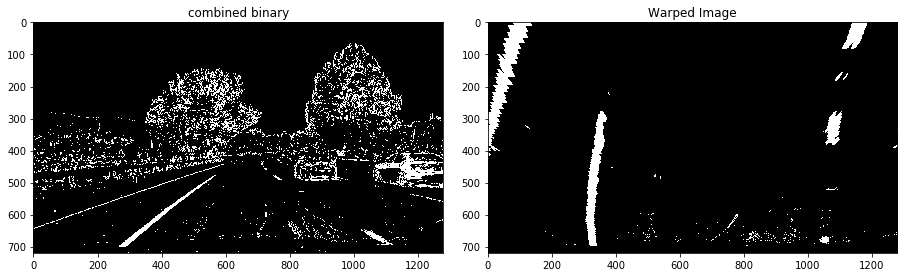

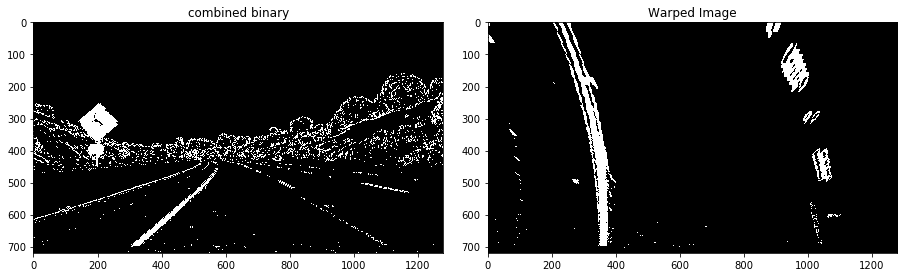

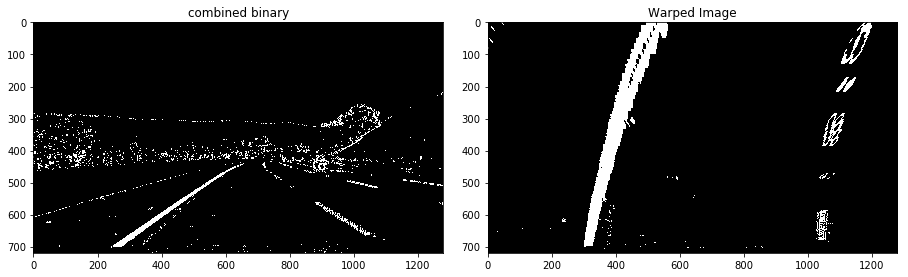

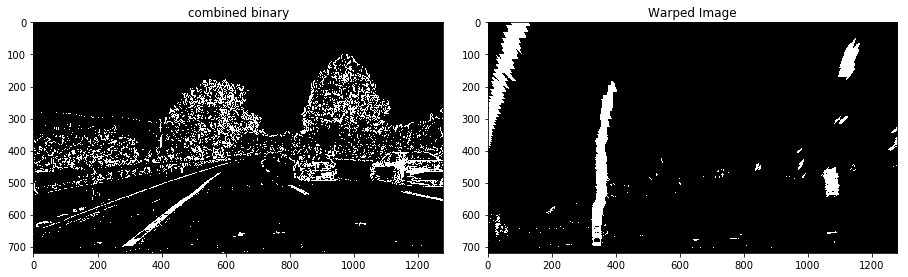

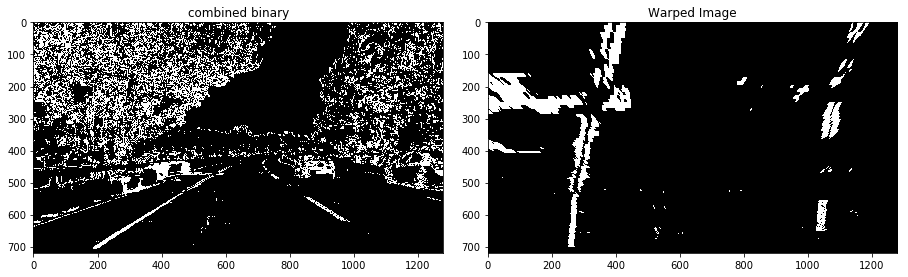

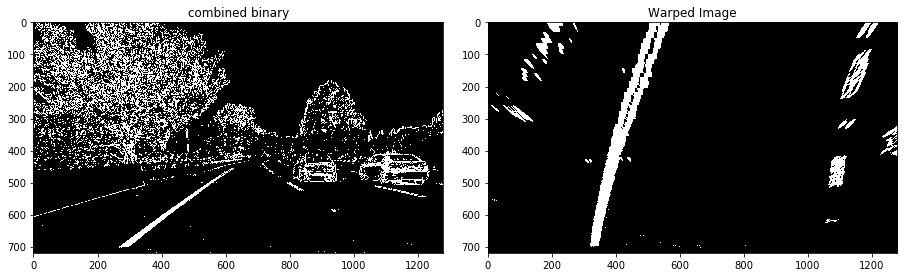

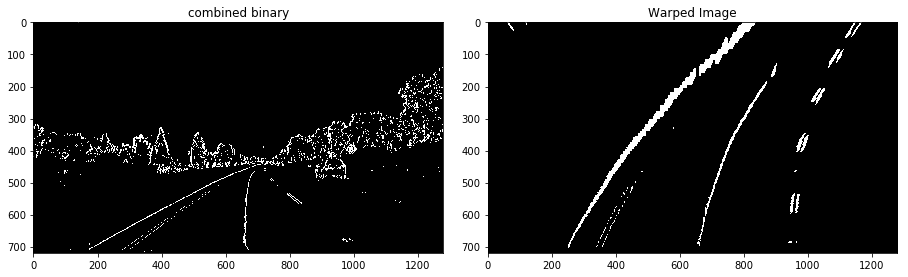

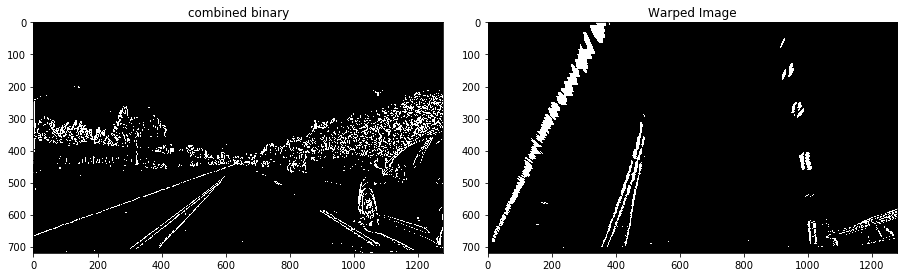

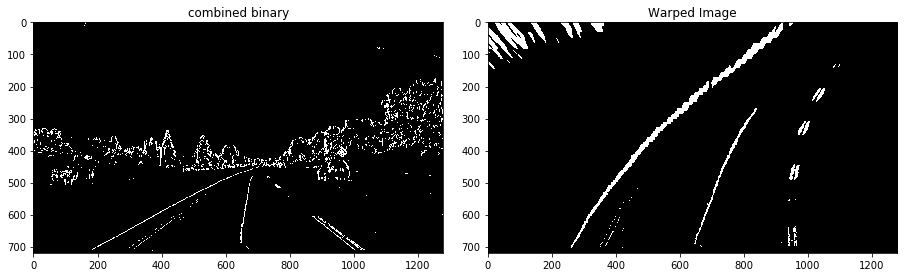

In [11]:
#Applying Image distortion to get bird's eye view
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=mpimg.imread(image)
    undist=U_image(img,objpoints,imgpoints)
    src,dst=srcNdst_cal(img)
    warped, M, Minv=W_image(undist, src, dst, img_size)
    color_binary, combined_binary,sxbinary,s_binary=thresholded_binary(undist)
    warped, M, Minv=W_image(combined_binary, src, dst, img_size)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    f.tight_layout()
    ax1.imshow(combined_binary,cmap='gray')
    ax1.set_title('combined binary', fontsize=12)
    ax2.imshow(warped,cmap='gray')
    ax2.set_title('Warped Image', fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

#### Fitting a Polynomial to lane lines and Drawing the lines 

In [12]:
#Finding curvature
def get_curvature(leftx, lefty, rightx, righty, ploty, image_size):
    y_eval = np.max(ploty)
    
    # Calculating curvature in pixel-space.
    
    #left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    #right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #print(left_curverad, right_curverad)
    ## Example values: 1926.74 1908.48
    
    # Convert from pixels to metres.
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Now our radius of curvature is in meters
    # Example values: 632.1 m    626.2 m
    
    # Calculate Lane Deviation from center of lane:
    # First we calculate the intercept points at the bottom of our image, then use those to 
    # calculate the lane deviation of the vehicle (assuming camera is in center of vehicle)
    scene_height = image_size[0] * ym_per_pix
    scene_width = image_size[1] * xm_per_pix
    
    left_intercept = left_fit_cr[0] * scene_height ** 2 + left_fit_cr[1] * scene_height + left_fit_cr[2]
    right_intercept = right_fit_cr[0] * scene_height ** 2 + right_fit_cr[1] * scene_height + right_fit_cr[2]
    calculated_center = (left_intercept + right_intercept) / 2.0
    
    lane_deviation = (calculated_center - scene_width / 2.0)
    
    return left_curverad, right_curverad, lane_deviation

In [13]:
#Finding Lane Lines
def find_lane_lines(binary_warped, debug=False):
    
    if debug == True:
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        if debug == True:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0,255,0), 2)
            cv2.rectangle(out_img, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0,255,0), 2)
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    l, r, d = get_curvature(leftx, lefty, rightx, righty, ploty, binary_warped.shape)
    
    if debug == True:
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        return left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d, out_img
    else:
        return left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d

In [14]:
def find_line(binary_warped,left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d, out_img):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)

    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return result



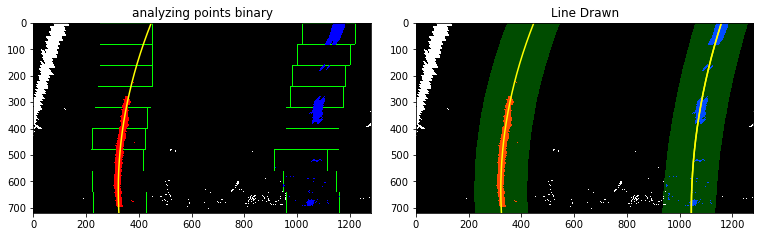

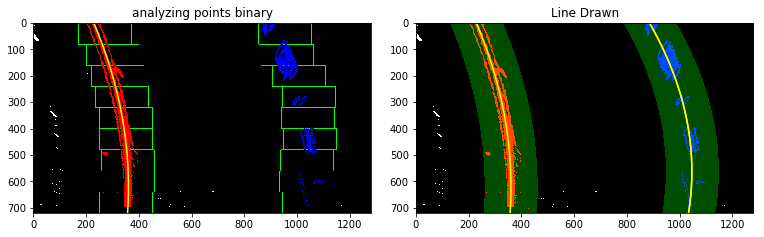

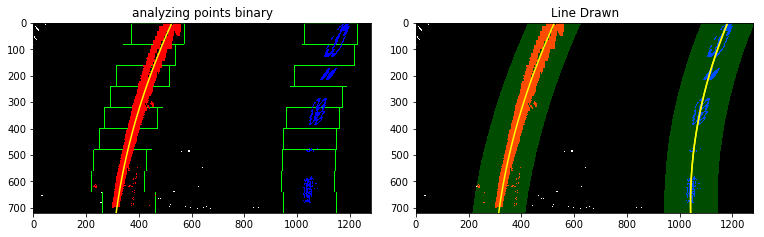

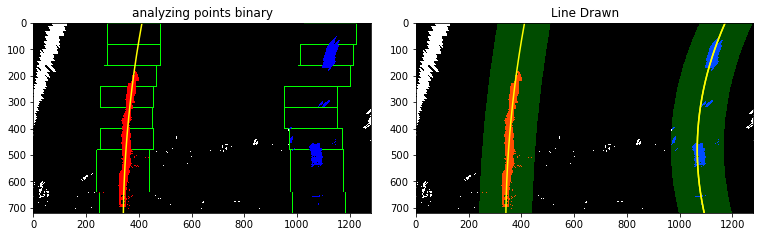

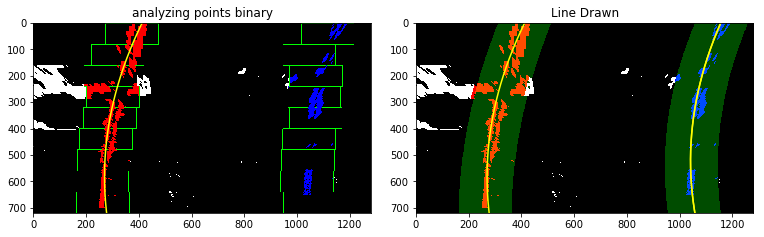

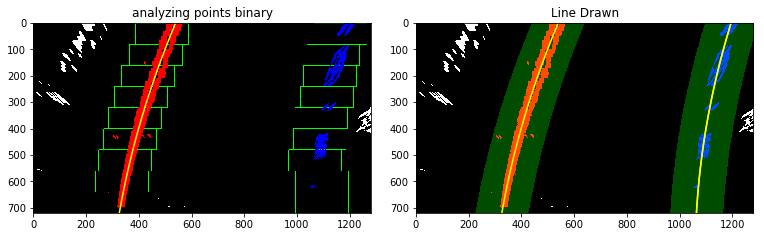

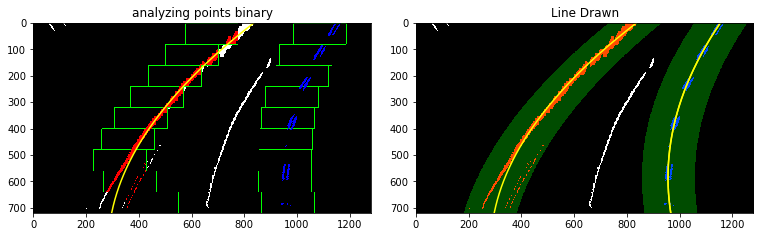

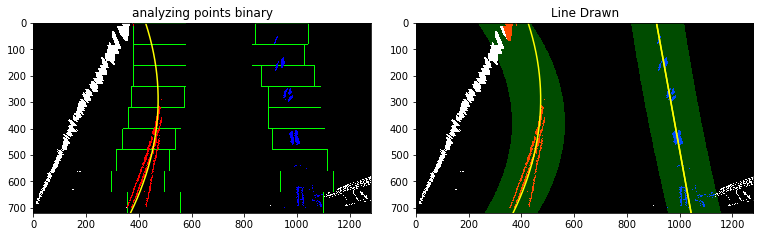

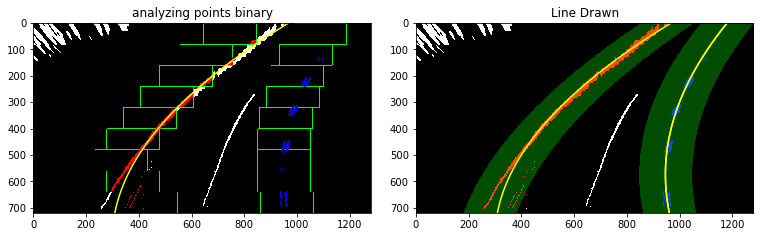

In [15]:
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=mpimg.imread(image)
    undist=U_image(img,objpoints,imgpoints)
    src,dst=srcNdst_cal(img)
    warped, M, Minv=W_image(undist, src, dst, img_size)
    color_binary, combined_binary,sxbinary,s_binary=thresholded_binary(undist)
    warped, M, Minv=W_image(combined_binary, src, dst, img_size)
    left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d, out_img = find_lane_lines(warped, debug=True)
    result=find_line(warped,left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d, out_img)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    f.tight_layout()
    ax1.imshow(out_img)
    ax1.plot(left_fitx,ploty,color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ax1.set_title('analyzing points binary', fontsize=12)
    ax2.imshow(result)
    ax2.plot(left_fitx, ploty, color='yellow')
    ax2.plot(right_fitx, ploty, color='yellow')
    ax2.set_title('Line Drawn', fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

In [16]:
def line_draw(binary_warped, undistorted_img, Minv, left_fitx, right_fitx, ploty, left_radius, right_radius, lane_deviation):
    
    # Create a blank image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (255, 0, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted_img.shape[1], undistorted_img.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted_img, 1, newwarp, 0.3, 0)
    
    curvature_text = "Curvature: Left = " + str(np.round(left_radius, 2)) + ", Right = " + str(np.round(right_radius, 2)) 
    font = cv2.FONT_HERSHEY_COMPLEX    
    cv2.putText(result, curvature_text, (30, 60), font, 1, (255,255,255), 2)
    deviation_text = "Lane deviation from center = {:.2f} m".format(lane_deviation) 
    font = cv2.FONT_HERSHEY_COMPLEX    
    cv2.putText(result, deviation_text, (30, 90), font, 1, (255,255,255), 2)
        
    return result

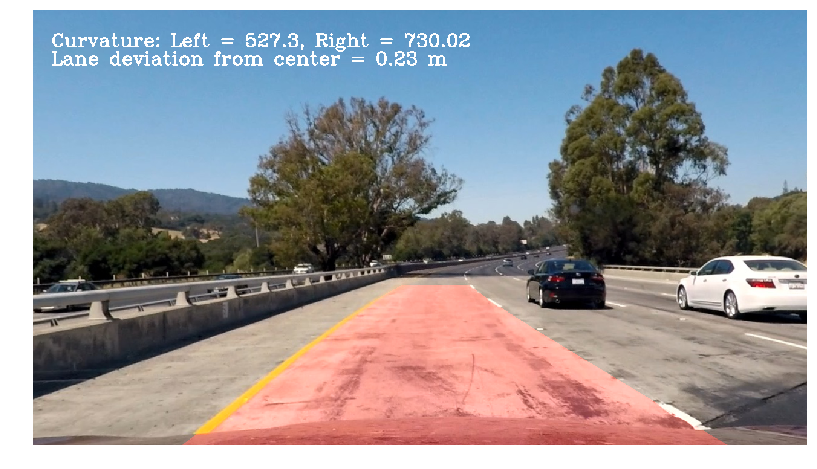

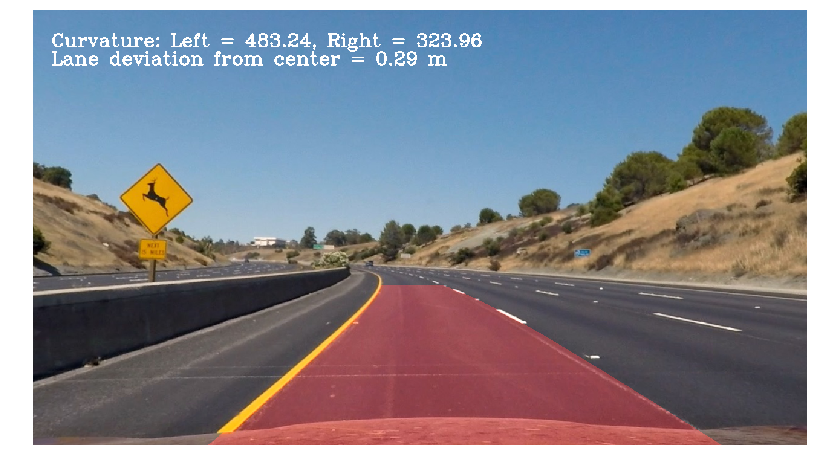

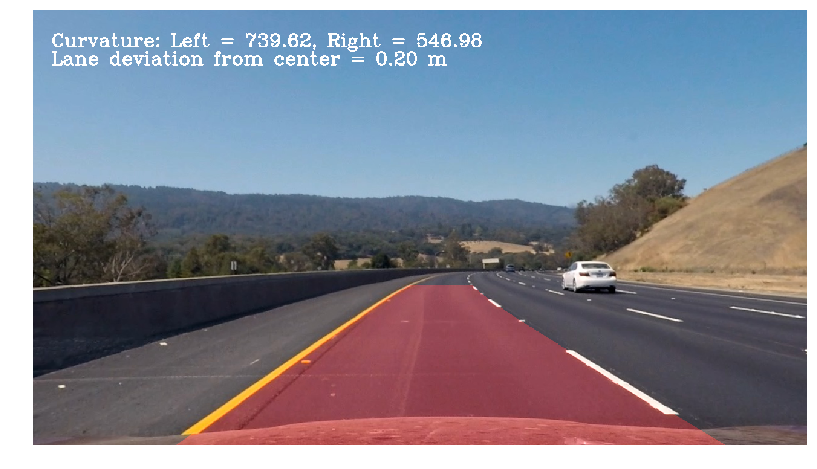

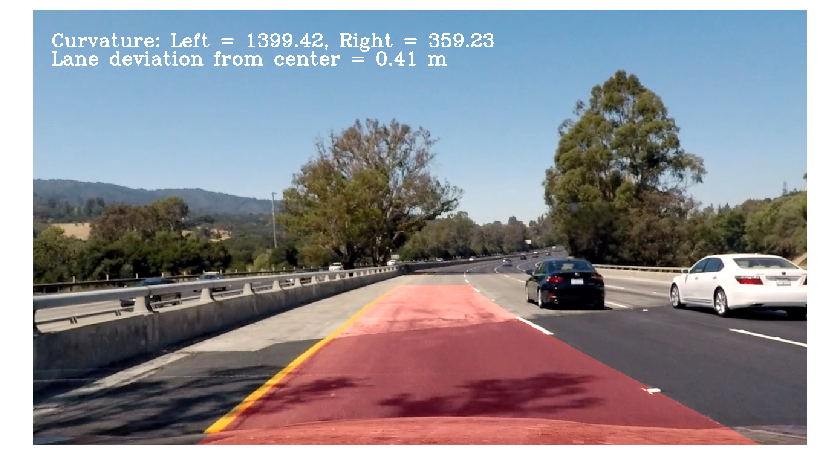

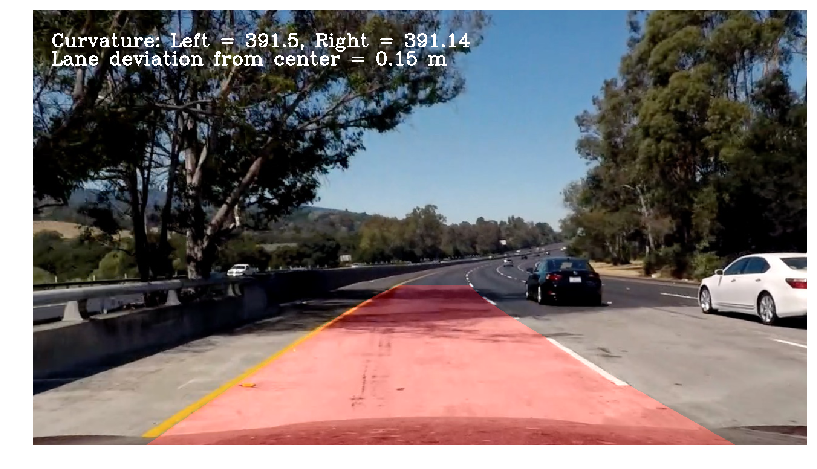

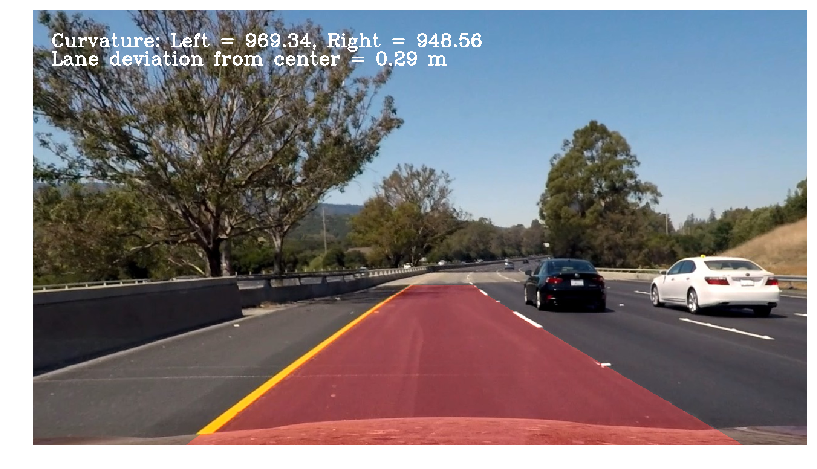

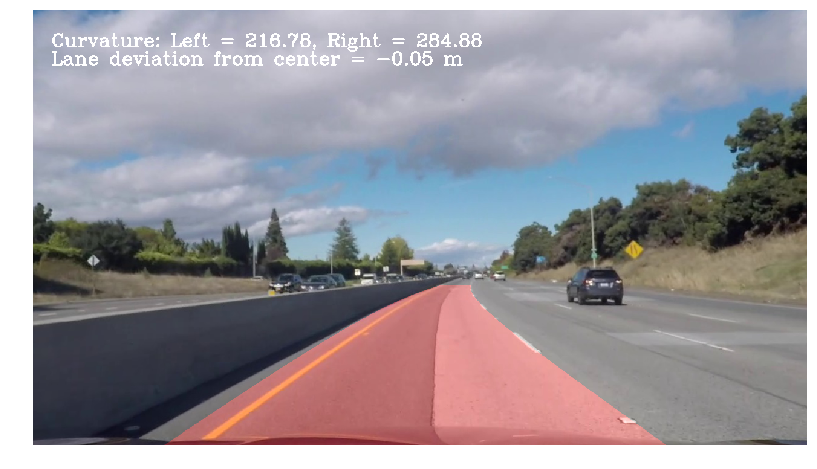

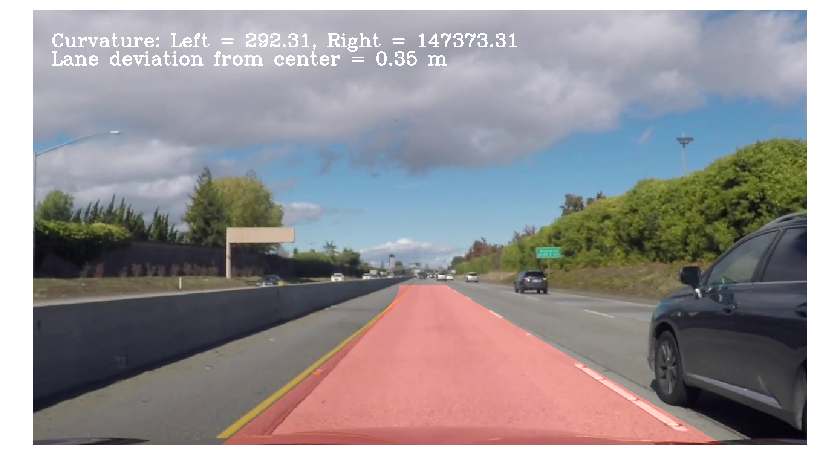

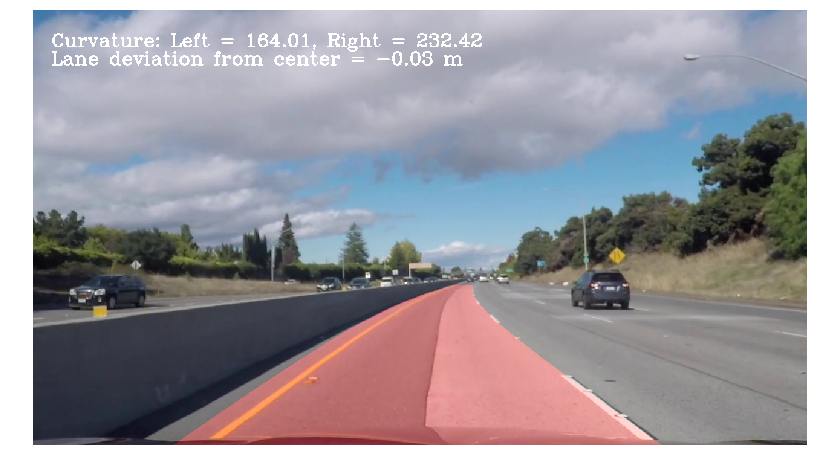

In [17]:
for image in glob.glob('test_images/test*.jpg'):
    img_size = (img.shape[1], img.shape[0])
    img=mpimg.imread(image)
    undist=U_image(img,objpoints,imgpoints)
    src,dst=srcNdst_cal(img)
    warped, M, Minv=W_image(undist, src, dst, img_size)
    color_binary, combined_binary,sxbinary,s_binary=thresholded_binary(undist)
    warped, M, Minv=W_image(combined_binary, src, dst, img_size)
    left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d, out_img = find_lane_lines(warped, debug=True)
    result=find_line(warped,left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d, out_img)
    final_line = line_draw(warped, undist, Minv, left_fitx, right_fitx, ploty, l, r, d)
    plt.figure(figsize=(16,8))
    plt.imshow(final_line)
    plt.axis("off")
    plt.show()

#### Applying Above Logic to Video Processing function

In [18]:
# Video Processing Pipeline
def process_image(image):
    img_size = (image.shape[1], image.shape[0])
    undist=U_image(image,objpoints,imgpoints)
    src,dst=srcNdst_cal(image)
    warped, M, Minv=W_image(undist, src, dst, img_size)
    color_binary, combined_binary,sxbinary,s_binary=thresholded_binary(undist)
    warped, M, Minv=W_image(combined_binary, src, dst, img_size)
    left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d, out_img = find_lane_lines(warped, debug=True)
    result=find_line(warped,left_fitx, right_fitx, ploty, left_fit, right_fit, l, r, d, out_img)
    final_line = line_draw(warped, undist, Minv, left_fitx, right_fitx, ploty, l, r, d)
    return final_line

In [24]:
from moviepy.editor import VideoFileClip
video_output = 'project_results.mp4'
video = VideoFileClip("project_video.mp4")
video = video.fl_image(process_image) 
video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_results.mp4
[MoviePy] Writing video project_results.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [47:00<00:04,  4.42s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_results.mp4 



### Drawbacks Of The Current Alogrithm

The above algorithm does not work well for the challenge video.This is because some adjustments needs to be done with image threshold and image parameters.
The problem of finetuning can be seen in above test images that had been taken from challenge video. 